<a href="https://colab.research.google.com/github/bmericskay/GeoPandas/blob/main/Seance2_Manipulation_donnees_spatiales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Séance 2 / Manipulation et représentation de données spatiales avec GeoPandas

GeoPandas est une librairie open source pour faciliter le travail avec des données géospatiales en python. GeoPandas étend les types de données utilisés par les pandas pour permettre des opérations spatiales sur des types géométriques. Les opérations géométriques sont effectuées par shapely. Geopandas dépend en outre de fiona pour l'accès aux fichiers et de matplotlib pour le traçage.

https://geopandas.org/en/stable/index.html

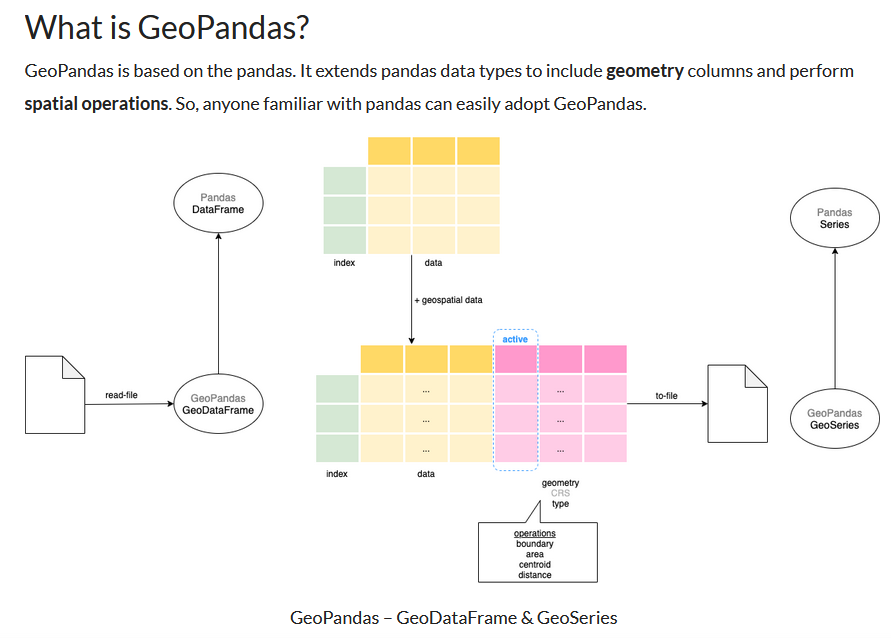

##Configuration de l'environnement de travail

In [ ]:
#Initialisation de l'environnement avec geopandas
!apt update
!apt install gdal-bin python-gdal python3-gdal
# Install rtree - Geopandas requirment
!apt install python3-rtree
# Install Geopandas
! pip install geopandas
# Instal MatplotLib
! pip install matplotlib
# Instal contextily
!pip install contextily
#Depuis sa version 0.8, Geopandas peut fonctionner de manière expérimental avec Pygeos ce qui accèlère certaines opérations
!pip install pygeos
# Pour la cartographie thématique
!pip install mapclassify
# Pour la cartographie interactive
!pip install folium
# Pour l'affichage d'une échelle cartographique
!pip install matplotlib_scalebar

In [28]:
#Importation des librairies nécessaires

import pandas as pd #Gestion de données
import matplotlib.pyplot as plt #Visualisation de données
import seaborn # Visualisation de données avancée
import geopandas as gpd #Gestion données spatiales
import contextily as ctx #Fonds de carte
import numpy as np #Manipulation de tableaux
import shapely #Manipulation de géométrie
import folium #Cartographie interactive
import mapclassify #Cartographie thématique
from matplotlib_scalebar.scalebar import ScaleBar #Echelle cartographique

#Importer et préparer les données spatiales de la séance

## Couche des IRIS

In [3]:
#Téléchargement des datas depuis le site opendata de Paris

!wget -O velib.geojson https://opendata.paris.fr/explore/dataset/velib-disponibilite-en-temps-reel/download/?format=geojson&timezone=Europe/Berlin&lang=fr
!wget -O IRIS.geojson https://data.iledefrance.fr/explore/dataset/iris/download/?format=geojson&refine.dep=75&timezone=Europe/Berlin&lang=fr

--2024-03-17 12:55:26--  https://opendata.paris.fr/explore/dataset/velib-disponibilite-en-temps-reel/download/?format=geojson
Resolving opendata.paris.fr (opendata.paris.fr)... 34.249.199.226, 34.248.20.69
Connecting to opendata.paris.fr (opendata.paris.fr)|34.249.199.226|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/json]
Saving to: ‘velib.geojson’

velib.geojson           [   <=>              ] 677.72K  1.14MB/s    in 0.6s    

2024-03-17 12:55:28 (1.14 MB/s) - ‘velib.geojson’ saved [693985]

/bin/bash: line 1: refine.dep=75: command not found
--2024-03-17 12:55:28--  https://data.iledefrance.fr/explore/dataset/iris/download/?format=geojson
Resolving data.iledefrance.fr (data.iledefrance.fr)... 109.232.232.161, 5.104.97.33
Connecting to data.iledefrance.fr (data.iledefrance.fr)|109.232.232.161|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/json]
Saving to: ‘IRIS.geojson’

IRIS.geo

### Importer la couche IRIS

Documentation import données SIG : https://geopandas.org/en/stable/docs/reference/api/geopandas.read_file.html

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry
0,Val de Grace 7,75105,1907,H,751051907,Paris 5e Arrondissement,75,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ..."
1,Gros Caillou 7,75107,2807,H,751072807,Paris 7e Arrondissement,75,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ..."
2,Madeleine 3,75108,3103,A,751083103,Paris 8e Arrondissement,75,"POLYGON ((2.31961 48.87451, 2.31962 48.87449, ..."
3,Roquette 18,75111,4318,H,751114318,Paris 11e Arrondissement,75,"POLYGON ((2.38202 48.86019, 2.38281 48.85939, ..."
4,Folie Mericourt 14,75111,4114,H,751114114,Paris 11e Arrondissement,75,"POLYGON ((2.37303 48.87062, 2.37301 48.87041, ..."


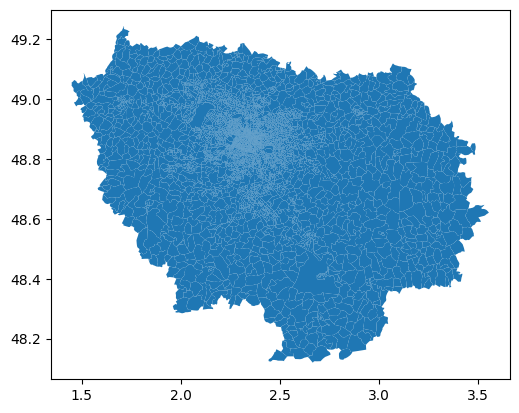

In [4]:
#Importer le couche des IRIS
IRIS= gpd.read_file("IRIS.geojson", encoding='utf-8')
IRIS.plot()
IRIS.head(5)

In [5]:
#Checker les types des champs de la couche IRIS
IRIS.dtypes

nom_iris       object
insee_com       int64
iris            int64
typ_iris       object
code_iris       int64
nom_com        object
dep             int64
geometry     geometry
dtype: object

### Préparer la couche

<Axes: >

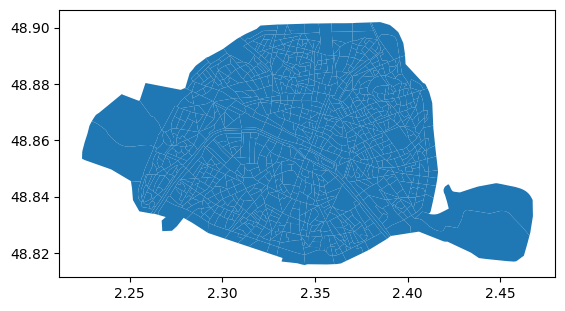

In [6]:
#Garder uniquement les IRIS de Paris
IRISPARIS = IRIS[(IRIS["dep"] == 75)]
IRISPARIS.plot()

In [7]:
#Garder que les colonnes utiles
IRISPARIS = IRISPARIS[["nom_iris", "insee_com", "code_iris", "geometry"]]
IRISPARIS.head(5)

,nom_iris,insee_com,code_iris,geometry
0,Val de Grace 7,75105,751051907,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ..."
1,Gros Caillou 7,75107,751072807,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ..."
2,Madeleine 3,75108,751083103,"POLYGON ((2.31961 48.87451, 2.31962 48.87449, ..."
3,Roquette 18,75111,751114318,"POLYGON ((2.38202 48.86019, 2.38281 48.85939, ..."
4,Folie Mericourt 14,75111,751114114,"POLYGON ((2.37303 48.87062, 2.37301 48.87041, ..."


In [8]:
#Créer une colonne avec le numéro de l'arrondissement
IRISPARIS['insee_com'] = IRISPARIS['insee_com'].astype(str)
IRISPARIS['ardt'] = IRISPARIS['insee_com'].str[-2:]
IRISPARIS.head()

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,nom_iris,insee_com,code_iris,geometry,ardt
0,Val de Grace 7,75105,751051907,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ...",05
1,Gros Caillou 7,75107,751072807,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ...",07
2,Madeleine 3,75108,751083103,"POLYGON ((2.31961 48.87451, 2.31962 48.87449, ...",08
3,Roquette 18,75111,751114318,"POLYGON ((2.38202 48.86019, 2.38281 48.85939, ...",11
4,Folie Mericourt 14,75111,751114114,"POLYGON ((2.37303 48.87062, 2.37301 48.87041, ...",11


### Changer la modélisation spatiale des données

<ipython-input-9-722176552134>:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  IRISPARIS.centroid.plot()


<Axes: >

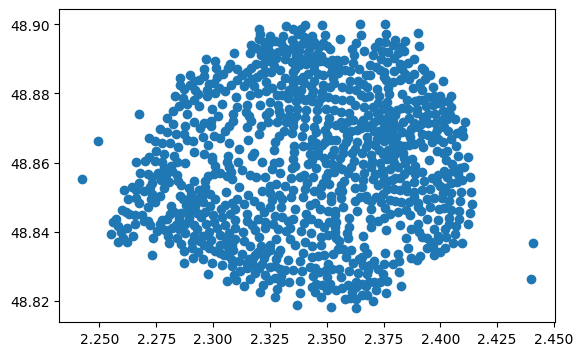

In [9]:
#Passer les polygones en centroides (à la volée)

IRISPARIS.centroid.plot()

<ipython-input-10-61f9ecc6efa4>:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  IRISPARIScentro.geometry = IRISPARIScentro['geometry'].centroid


,nom_iris,insee_com,code_iris,geometry,ardt
0,Val de Grace 7,75105,751051907,POINT (2.34618 48.84265),05
1,Gros Caillou 7,75107,751072807,POINT (2.29659 48.85457),07
2,Madeleine 3,75108,751083103,POINT (2.31594 48.87337),08
3,Roquette 18,75111,751114318,POINT (2.38138 48.85878),11
4,Folie Mericourt 14,75111,751114114,POINT (2.37312 48.86919),11


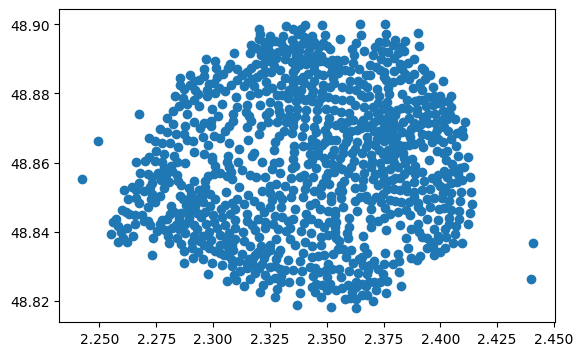

In [10]:
#Passer les polygones en centroides (création d'une nouvelle une couche)

IRISPARIScentro = IRISPARIS.copy()
IRISPARIScentro.geometry = IRISPARIScentro['geometry'].centroid
IRISPARIScentro.plot()
IRISPARIScentro.head(5)

<Axes: >

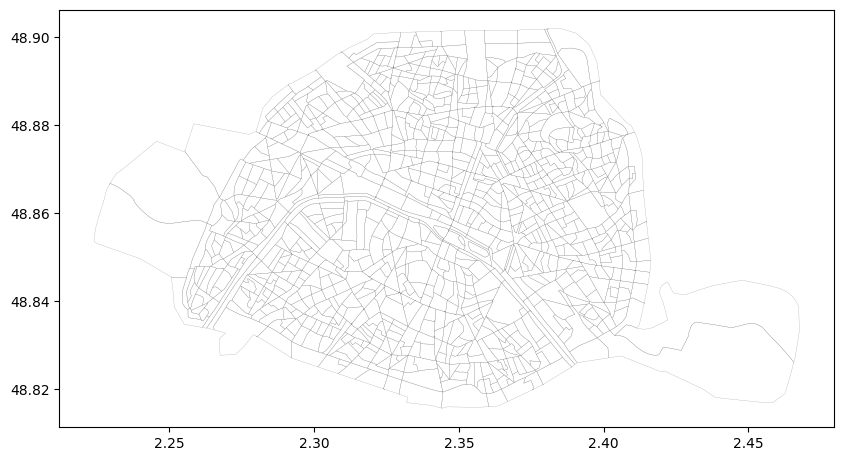

In [11]:
#Cartographier les IRIS en mode contours

IRISPARIS.boundary.plot(figsize=(10,10), linewidth=0.15, color = 'grey')

<Axes: >

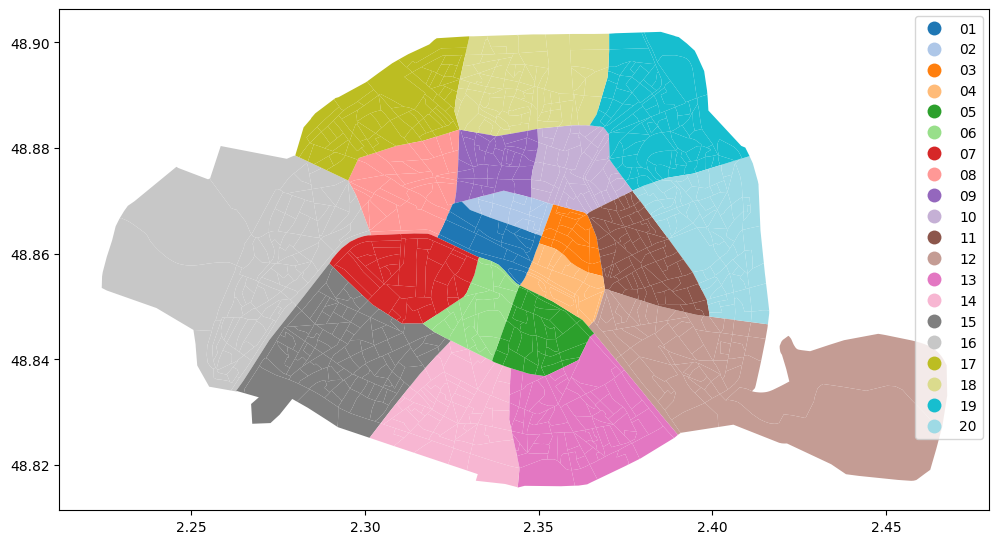

In [12]:
#Cartographier les IRIS en fonction de l'arrondissement

IRISPARIS.plot(column = "ardt", linewidth=0.5, figsize=(12,10), cmap='tab20', legend=True)

In [13]:
# Faire une carte interactive avec la biliothèque Folium (https://python-visualization.github.io/folium/)

map = folium.Map(
    width='80%',height='50%',
    location=[48.863170000122665, 2.342566412818605],
    zoom_start=12,
    tiles="cartodbpositron")

IRIS = folium.GeoJson(IRISPARIS).add_to(map)

folium.GeoJsonTooltip(['nom_iris', 'ardt']).add_to(IRIS)

map

In [14]:
# Exporter cette carte en HTML

map.save(outfile= "folium.html")

## La couche Vélibs

,name,stationcode,ebike,mechanical,duedate,numbikesavailable,numdocksavailable,capacity,is_renting,is_installed,nom_arrondissement_communes,is_returning,geometry
0,Rouget de L'isle - Watteau,44015,0,2,2024-03-17 12:37:46+00:00,2,18,20,OUI,OUI,Vitry-sur-Seine,OUI,POINT (2.39630 48.77819)
1,Benjamin Godard - Victor Hugo,16107,1,3,2024-03-17 12:37:19+00:00,4,30,35,OUI,OUI,Paris,OUI,POINT (2.27572 48.86598)
2,Mairie du 12ème,12109,5,24,2024-03-17 12:38:31+00:00,29,0,30,OUI,OUI,Paris,OUI,POINT (2.38755 48.84086)
3,Mairie de Rosny-sous-Bois,31104,22,1,2024-03-17 12:31:58+00:00,23,4,30,OUI,OUI,Rosny-sous-Bois,OUI,POINT (2.48658 48.87126)
4,Cassini - Denfert-Rochereau,14111,3,3,2024-03-17 12:38:06+00:00,6,19,25,OUI,OUI,Paris,OUI,POINT (2.33604 48.83753)


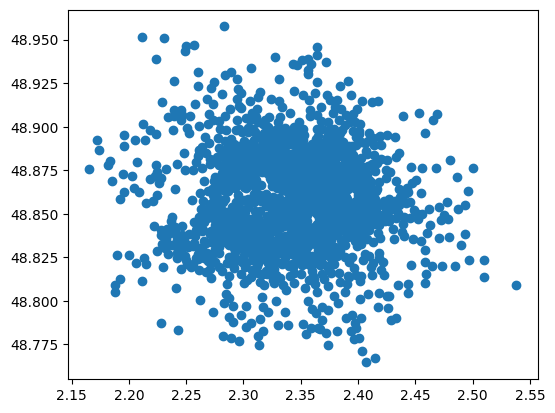

In [15]:
#Importer la couche des velibs

Velib= gpd.read_file("velib.geojson", encoding='utf-8')
Velib.plot()
Velib.head()

990

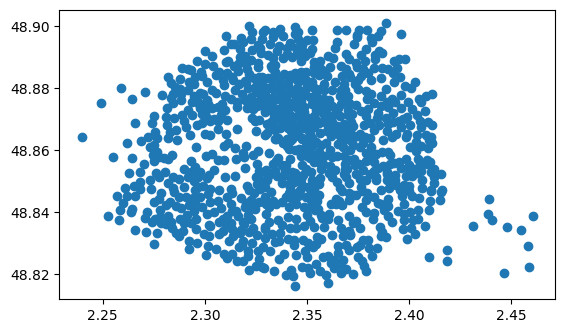

In [32]:
#Ne garder que les stations de Velibs de la ville de Paris (sélection par attribut)

VelibParis = Velib[(Velib["nom_arrondissement_communes"] == 'Paris')]
VelibParis.plot()
len(VelibParis)

In [34]:
#Créer une colonne latitude et longitude
VelibParis['latitude'] = VelibParis.geometry.y
VelibParis['longitude'] = VelibParis.geometry.x

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [35]:
# Ne garder que les champs intéressants et les renommer

VelibParis = VelibParis[["name", "stationcode", "ebike", "mechanical", "numbikesavailable", "numdocksavailable", "capacity", "latitude", "longitude", "geometry"]]
VelibParis = VelibParis.rename(columns={'name': 'Nom', 'stationcode':'Code', 'ebike': 'Veloselectriques', 'ebike': 'Veloselectriques', 'mechanical': 'Velosmecaniques', 'numbikesavailable': 'Velosdispo', 'numdocksavailable': 'Soclesdispo', 'capacity': 'Capacite'})
VelibParis.head()

,Nom,Code,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,latitude,longitude,geometry
1,Benjamin Godard - Victor Hugo,16107,1,3,4,30,35,48.865983,2.275725,POINT (2.27572 48.86598)
2,Mairie du 12ème,12109,5,24,29,0,30,48.840855,2.387555,POINT (2.38755 48.84086)
4,Cassini - Denfert-Rochereau,14111,3,3,6,19,25,48.837526,2.336035,POINT (2.33604 48.83753)
5,Toudouze - Clauzel,9020,1,3,4,17,21,48.879296,2.337360,POINT (2.33736 48.87930)
7,Jourdan - Stade Charléty,14014,23,18,41,18,60,48.819428,2.343335,POINT (2.34334 48.81943)


###La couche des arrondissements (à importer via un fichier en local)

https://opendata.paris.fr/explore/dataset/arrondissements/export/?disjunctive.c_ar&disjunctive.c_arinsee&disjunctive.l_ar

,n_sq_ar,c_ar,c_arinsee,l_ar,l_aroff,n_sq_co,surface,perimetre,geom_x_y,geometry
0,750000019,19,75119,19ème Ardt,Buttes-Chaumont,750001537,6.792651e+06,11253.182479,"{'lon': 2.384820960152517, 'lat': 48.887075996...","POLYGON ((2.38943 48.90122, 2.39014 48.90108, ..."
1,750000001,1,75101,1er Ardt,Louvre,750001537,1.824613e+06,6054.936862,"{'lon': 2.3364433620533878, 'lat': 48.86256270...","POLYGON ((2.32801 48.86992, 2.32997 48.86851, ..."
2,750000003,3,75103,3ème Ardt,Temple,750001537,1.170883e+06,4519.263648,"{'lon': 2.360000985897692, 'lat': 48.862872380...","POLYGON ((2.36383 48.86750, 2.36389 48.86747, ..."
3,750000014,14,75114,14ème Ardt,Observatoire,750001537,5.614877e+06,10317.483310,"{'lon': 2.3265420441989466, 'lat': 48.82924450...","POLYGON ((2.33381 48.84061, 2.33673 48.83965, ..."
4,750000004,4,75104,4ème Ardt,Hôtel-de-Ville,750001537,1.600586e+06,5420.908434,"{'lon': 2.357629620324997, 'lat': 48.854341426...","POLYGON ((2.36851 48.85573, 2.36900 48.85374, ..."


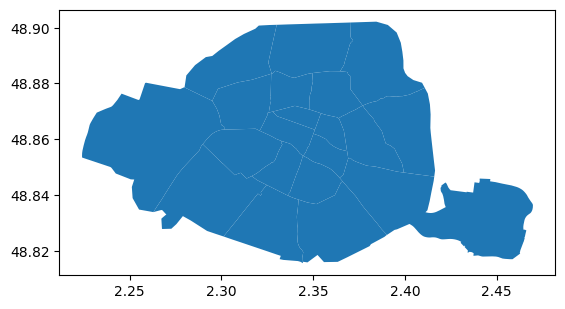

In [73]:
#Importer le jeu de données dans l'espace de travail puis le convertir en gdf

Ardt= gpd.read_file("arrondissements.geojson", encoding='utf-8')
Ardt.plot()
Ardt.head()

## Ecrire un jeu de données spatiales

Documentation export données spatiales : https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.to_file.html

In [ ]:
#Ecrire un geojson

VelibParis.to_file("Velibs.geojson", driver="GeoJSON")

In [ ]:
#Ecrire un gpk

IRISPARIS.to_file("Paris.gpkg", layer='IRIS', driver="GPKG")
VelibParis.to_file("Paris.gpkg", layer='VelibParis', driver="GPKG")
Ardt.to_file("Paris.gpkg", layer='Ardt', driver="GPKG")

# Calculer des statistique basiques (descriptives)

In [46]:
#Calculer des statistiques basiques pour tous les champs de la couche des vélibs

VelibParis.describe()

,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,latitude,longitude
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,4.149495,8.515152,12.664646,18.564646,32.192929,48.860143,2.343432
std,3.823174,10.735315,11.763023,11.710588,12.939861,0.020143,0.038857
min,0.000000,0.000000,0.000000,0.000000,0.000000,48.816219,2.239905
25%,2.000000,1.000000,4.000000,9.250000,23.000000,48.843853,2.316438
50%,3.000000,5.000000,9.000000,18.000000,30.000000,48.860916,2.344564
75%,6.000000,12.000000,17.000000,26.000000,39.000000,48.876295,2.371129
max,30.000000,65.000000,69.000000,57.000000,74.000000,48.900990,2.460549


In [47]:
# Calculer le nombre de stations de vélibs

VelibParis["Code"].size

990

In [48]:
# Calculer la somme totale des capacités des stations

VelibParis["Capacite"].sum()

31871

In [49]:
# Calculer la moyenne des capacités par station

VelibParis["Capacite"].mean()

32.19292929292929

In [50]:
#Calculer le nombre total de vélibs, le nombre total vélibs électrique et le nombre total de vélibs mécaniques
A=VelibParis['Velosdispo'].sum()
B=VelibParis['Velosmecaniques'].sum()
C=VelibParis['Veloselectriques'].sum()

print(A, 'vélos disponibles  / ', B, 'vélos mécaniques  / ', C, 'vélos électriques')

12538 vélos disponibles  /  8430 vélos mécaniques  /  4108 vélos électriques


In [51]:
# Créer une fonction pour sortir un indicateur formaté et compréhensible

Txveloelec = (VelibParis['Veloselectriques'].sum())/ (VelibParis['Velosdispo'].sum()) *100
Txveloelec = round(Txveloelec,1)
print ("Taux de vélos électriques " + str(Txveloelec) + "%")

Taux de vélos électriques 32.8%


Text(0.5, 0, 'Nombre de socles')

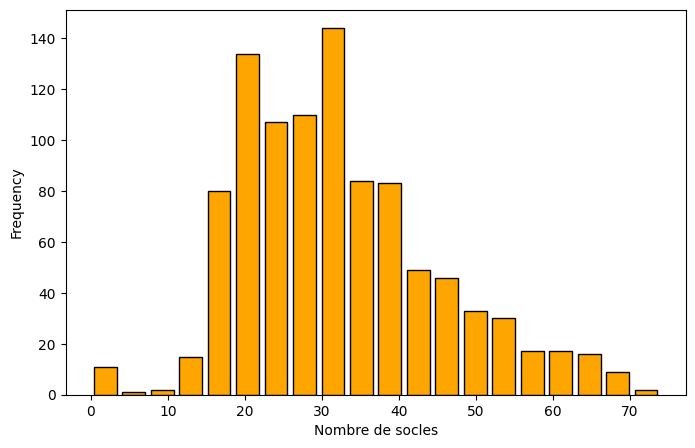

In [55]:
# Histogramme de distribution des capacités des stations
ax = VelibParis.plot.hist(y='Capacite', figsize=(8, 5), bins=20, rwidth=0.8, edgecolor='black', color='orange',legend=False)
ax.set_xlabel('Nombre de socles')

<Axes: xlabel='Capacite', ylabel='Veloselectriques'>

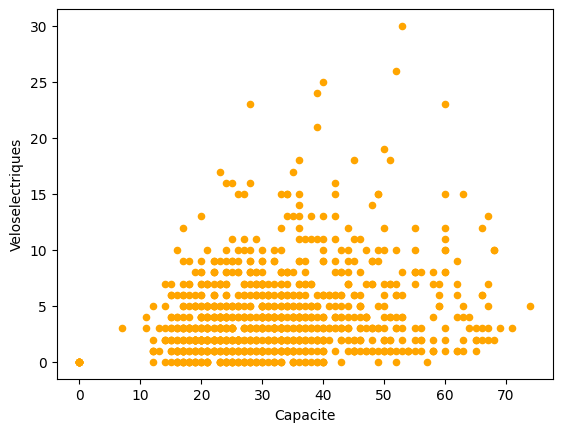

In [53]:
# Scatterplot

VelibParis.plot.scatter('Capacite', 'Veloselectriques', color= 'orange' )

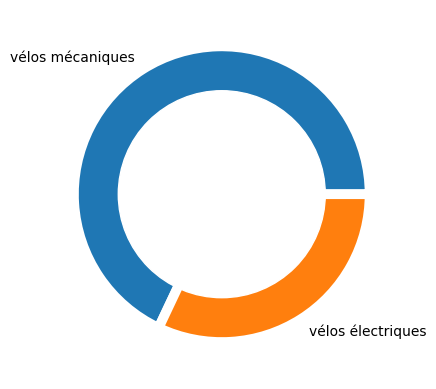

In [54]:
names = ['vélos mécaniques', 'vélos électriques']
size = [7787 ,3669]

# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Custom wedges
plt.pie(size, labels=names, wedgeprops = { 'linewidth' : 7, 'edgecolor' : 'white' })
p = plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

# Calculer de nouvelles colonnes

In [56]:
# Ajouter une colonne avec le tx de disponibilité de chaque stations

VelibParis["Txdispo"] = VelibParis["Soclesdispo"] / VelibParis["Capacite"] *100
VelibParis.head()

,Nom,Code,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,latitude,longitude,geometry,Txdispo
1,Benjamin Godard - Victor Hugo,16107,1,3,4,30,35,48.865983,2.275725,POINT (2.27572 48.86598),85.714286
2,Mairie du 12ème,12109,5,24,29,0,30,48.840855,2.387555,POINT (2.38755 48.84086),0.000000
4,Cassini - Denfert-Rochereau,14111,3,3,6,19,25,48.837526,2.336035,POINT (2.33604 48.83753),76.000000
5,Toudouze - Clauzel,9020,1,3,4,17,21,48.879296,2.337360,POINT (2.33736 48.87930),80.952381
7,Jourdan - Stade Charléty,14014,23,18,41,18,60,48.819428,2.343335,POINT (2.34334 48.81943),30.000000


In [57]:
# Ajouter une colonne avec le tx de disponibilité de chaque stations

VelibParis["Txoccupation"] = 100 - VelibParis["Txdispo"]
VelibParis.head()

,Nom,Code,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,latitude,longitude,geometry,Txdispo,Txoccupation
1,Benjamin Godard - Victor Hugo,16107,1,3,4,30,35,48.865983,2.275725,POINT (2.27572 48.86598),85.714286,14.285714
2,Mairie du 12ème,12109,5,24,29,0,30,48.840855,2.387555,POINT (2.38755 48.84086),0.000000,100.000000
4,Cassini - Denfert-Rochereau,14111,3,3,6,19,25,48.837526,2.336035,POINT (2.33604 48.83753),76.000000,24.000000
5,Toudouze - Clauzel,9020,1,3,4,17,21,48.879296,2.337360,POINT (2.33736 48.87930),80.952381,19.047619
7,Jourdan - Stade Charléty,14014,23,18,41,18,60,48.819428,2.343335,POINT (2.34334 48.81943),30.000000,70.000000


In [58]:
# Définir le type de station (emetrice ou réceptrice)

VelibParis.loc[VelibParis['Velosdispo'] <VelibParis['Soclesdispo'], 'Type'] = 'Emetrice'
VelibParis.loc[VelibParis['Velosdispo'] >=VelibParis['Soclesdispo'], 'Type'] = 'Receptrice'
VelibParis.head()

,Nom,Code,Veloselectriques,Velosmecaniques,Velosdispo,Soclesdispo,Capacite,latitude,longitude,geometry,Txdispo,Txoccupation,Type
1,Benjamin Godard - Victor Hugo,16107,1,3,4,30,35,48.865983,2.275725,POINT (2.27572 48.86598),85.714286,14.285714,Emetrice
2,Mairie du 12ème,12109,5,24,29,0,30,48.840855,2.387555,POINT (2.38755 48.84086),0.000000,100.000000,Receptrice
4,Cassini - Denfert-Rochereau,14111,3,3,6,19,25,48.837526,2.336035,POINT (2.33604 48.83753),76.000000,24.000000,Emetrice
5,Toudouze - Clauzel,9020,1,3,4,17,21,48.879296,2.337360,POINT (2.33736 48.87930),80.952381,19.047619,Emetrice
7,Jourdan - Stade Charléty,14014,23,18,41,18,60,48.819428,2.343335,POINT (2.34334 48.81943),30.000000,70.000000,Receptrice


# Cartographie thématique

* Couleurs de ColorBrewer > https://www.datanovia.com/en/wp-content/uploads/dn-tutorials/ggplot2/figures/101-rcolorbrewer-palette-rcolorbrewer-palettes-1.png

* Inverser palette de couleur : _r

* Documentation carto thématique : https://geopandas.org/en/stable/gallery/choropleths.html

## Cartographies de base

<Axes: >

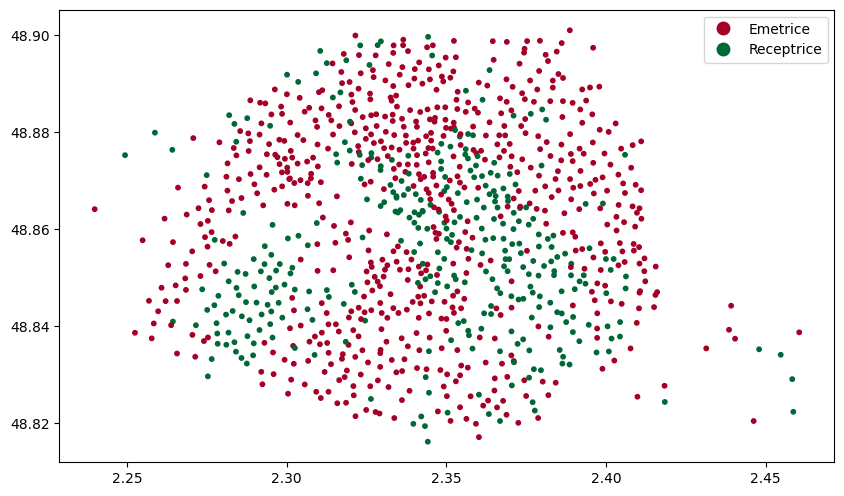

In [59]:
#Cartographier le type de station (catégorisation)

VelibParis.plot(figsize=(10,10), alpha=1, column="Type", cmap='RdYlGn', categorical=True, markersize=10, legend=True)

<Axes: >

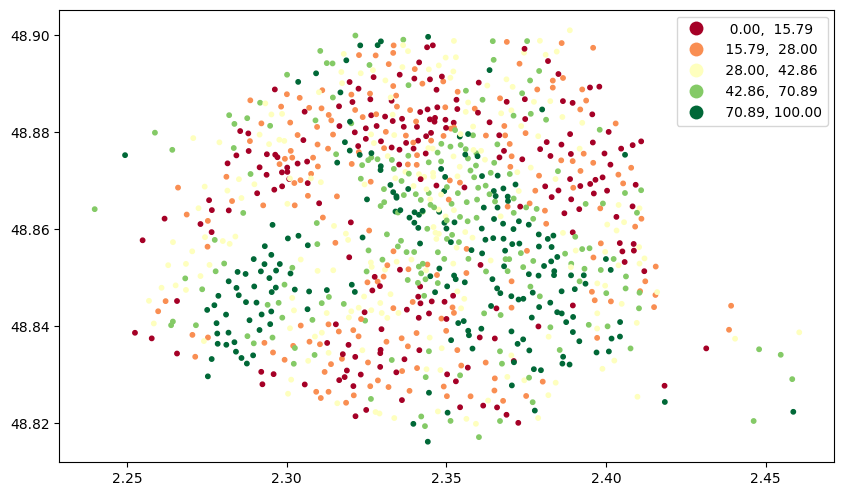

In [84]:
#Cartographier le taux d'occupation par station (graduation de couleurs)

VelibParis.plot(figsize=(10,10), alpha=1, column="Txoccupation", cmap='RdYlGn',scheme='quantiles', markersize=10, categorical=False, legend=True)

<Axes: >

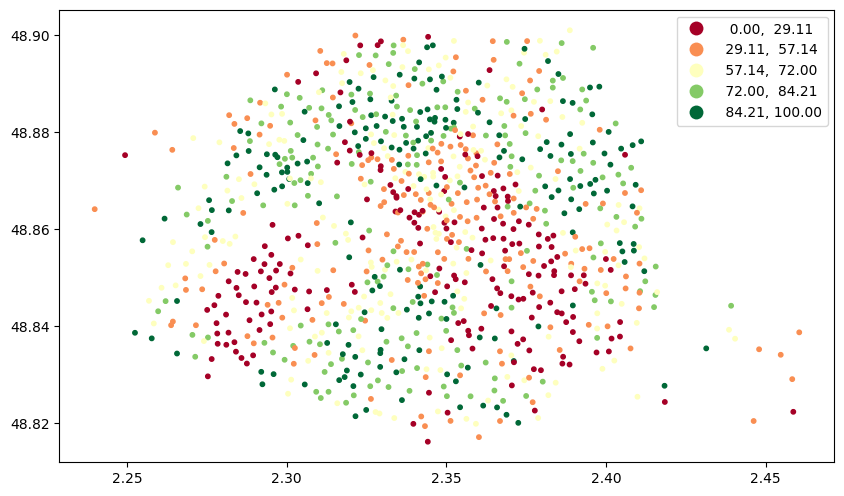

In [85]:
#Cartographier le taux de disponibilité par station (graduation de couleurs)

VelibParis.plot(figsize=(10,10), alpha=1, column="Txdispo", cmap='RdYlGn',scheme='quantiles', markersize=10, categorical=False, legend=True)

<Axes: >

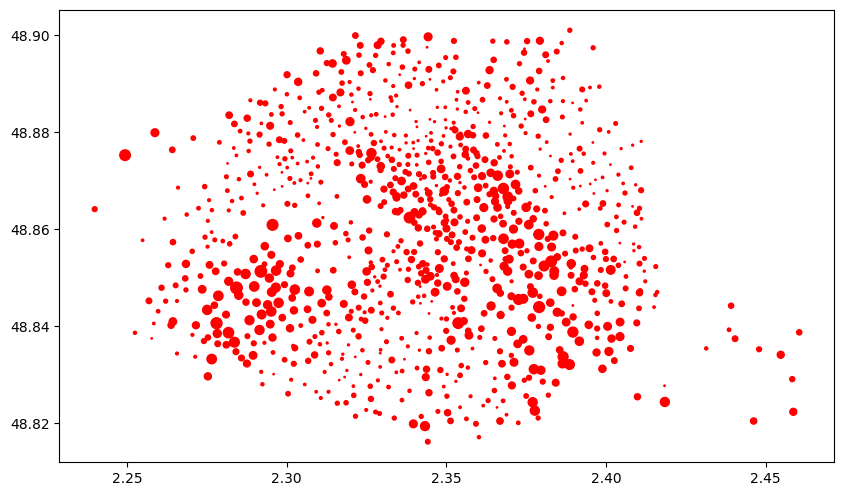

In [61]:
#Cartographier le nombre de vélibs disponibles par station (variation de tailles)

VelibParis.plot(figsize=(10,10), markersize="Velosdispo",alpha=1, color = 'red', categorical=False, legend=True)

<Axes: >

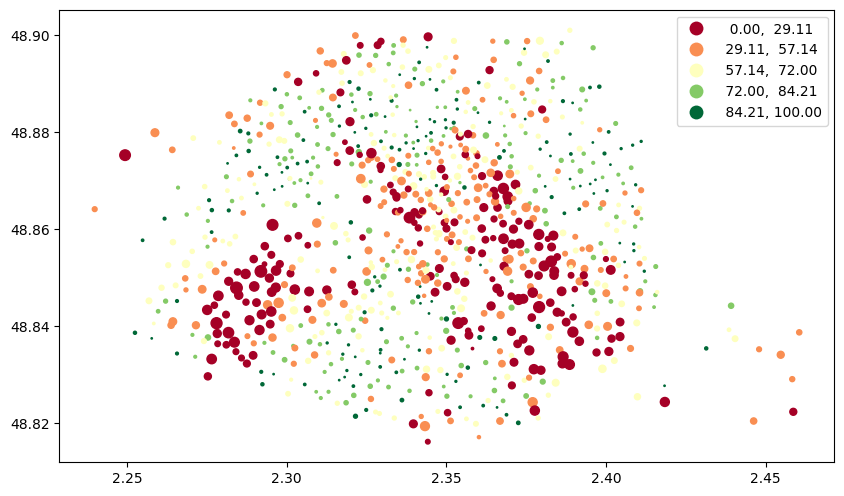

In [86]:
#Cartographier le nombre de vélibs disponibles et le taux d'occupation par station (variation de tailles et de couleurs)

VelibParis.plot(figsize=(10,10), markersize="Velosdispo",alpha=1, column="Txdispo", cmap='RdYlGn',scheme='quantiles', categorical=False, legend=True)

## Habiller ses cartes (fond de carte, titre, échelles...)
https://contextily.readthedocs.io/en/latest/intro_guide.html

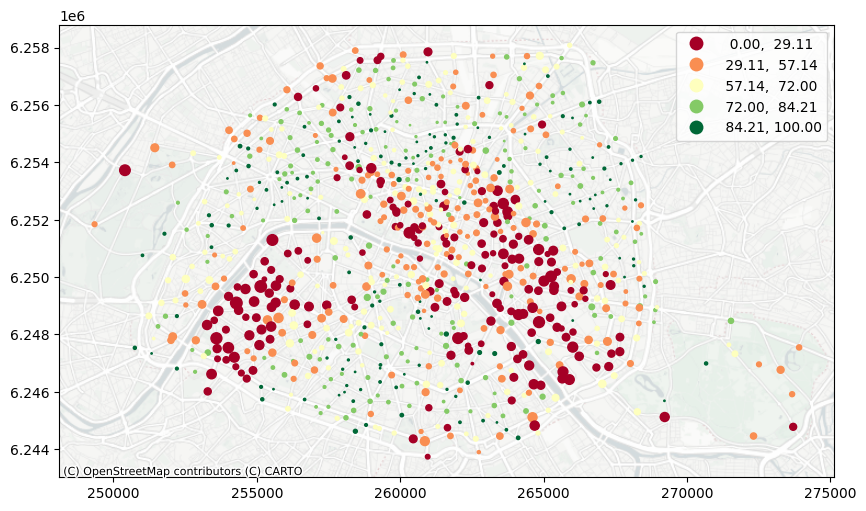

In [67]:
#Cartographier le nombre de vélibs disponibles et le taux d'occupation par station avec un fond de carte CartoDB

ax = VelibParis.to_crs('EPSG:3857').plot(figsize=(10,10),markersize="Velosdispo",alpha=1, column="Txdispo", cmap='RdYlGn',scheme='quantiles', categorical=False, legend=True)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.PositronNoLabels)

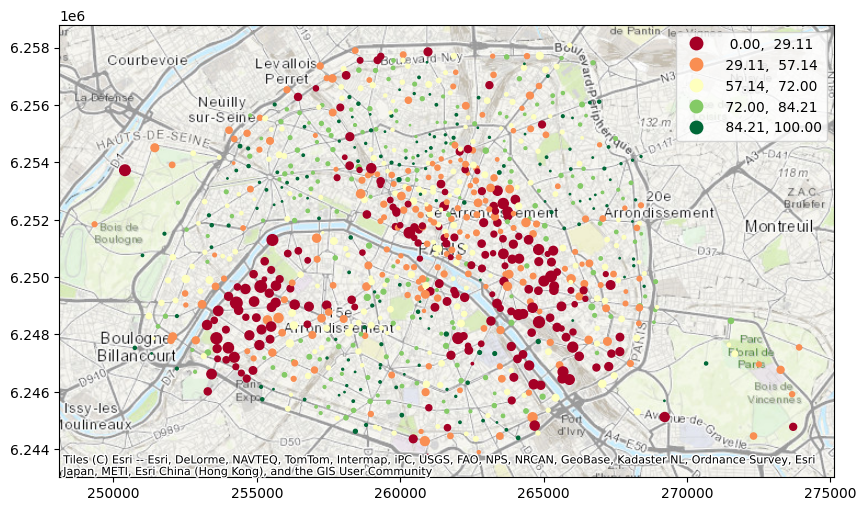

In [82]:
#Cartographier le nombre de vélibs disponibles et le taux d'occupation par station avec un fond de carte Esri

ax = VelibParis.to_crs('EPSG:3857').plot(figsize=(10,10),markersize="Velosdispo",alpha=1, column="Txdispo", cmap='RdYlGn',scheme='quantiles', categorical=False, legend=True)

ctx.add_basemap(ax, source=ctx.providers.Esri.WorldTopoMap)

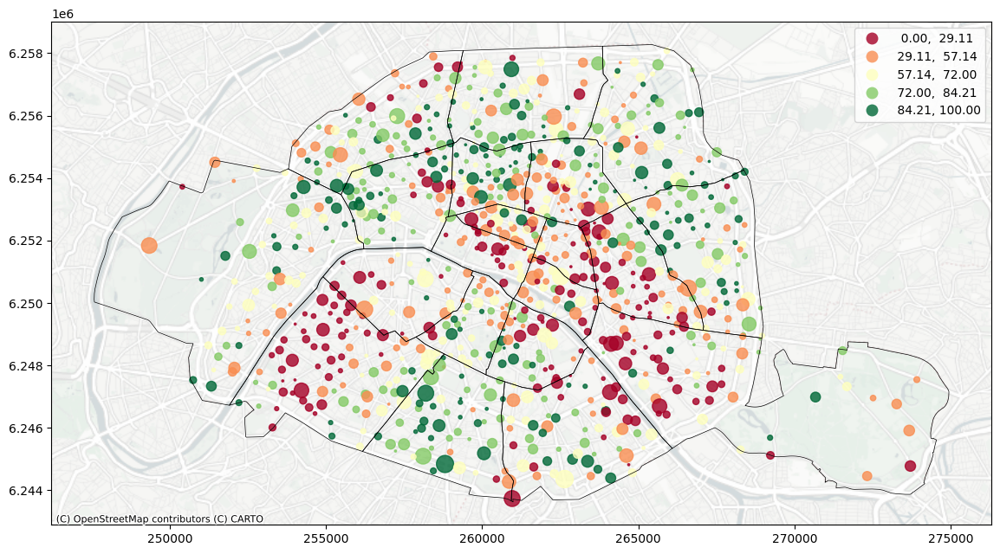

In [76]:
#Faire une carte avec deux couches et un fond de carte

Carte1, ax = plt.subplots(figsize=(14,14))  # COnfiguration de la carte

VelibParis.to_crs('EPSG:3857').plot(ax=ax, markersize=VelibParis['Velosdispo']*3,column="Txdispo", cmap='RdYlGn',scheme='quantiles', alpha=0.8, categorical=False,legend=True,) # Configuration couche des vélibs

Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'black') # Configuration couche arrondissements

ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels) # Configuration du fond de carte

plt.show() #Génération de la carte

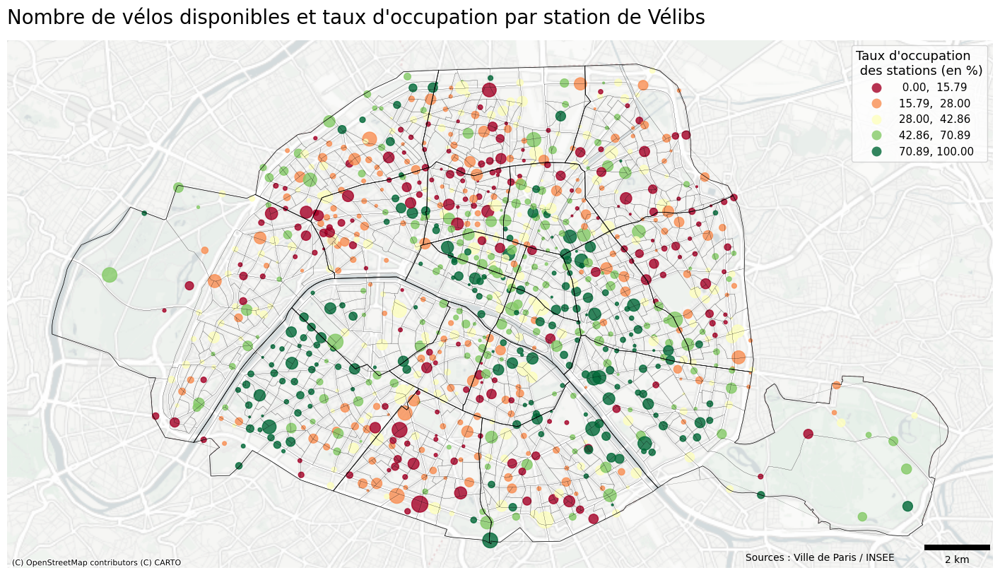

In [80]:
#Faire une carte finalisée avec trois couches

Carte1, ax = plt.subplots(figsize=(18,18)) # Propriétés de la carte

Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'black') # Ajout des arrondissements (contours)
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'black') # Ajout des IRIS (contours)

# Ajout des stations de velibs (couleur et tailles avec personnalisation légende)
VelibParis.to_crs('EPSG:3857').plot(ax=ax, markersize=VelibParis['Velosdispo']*4,column="Txoccupation", cmap='RdYlGn',scheme='quantiles', alpha=0.8, categorical=False,
                                    legend=True, legend_kwds={'title': "Taux d'occupation \n des stations (en %)", 'loc': 'upper right', 'title_fontsize':13, 'fontsize':11})

# Ajout fond de carte
ctx.add_basemap(ax,source=ctx.providers.CartoDB.PositronNoLabels)


# On enlève les axes
ax.axis("off")

# Ajout du titre de la carte
plt.title("Nombre de vélos disponibles et taux d'occupation par station de Vélibs", loc='left', fontsize=20)

#Ajout d'une échelle
ax.add_artist(ScaleBar(1, length_fraction=0.1, location = "lower right", box_alpha=0, color="black"))

# Ajout des sources
ax.text(0.90, 0.01, 'Sources : Ville de Paris / INSEE', verticalalignment='bottom', horizontalalignment='right',
        transform=ax.transAxes, color='black', fontsize=10)


plt.show()

In [81]:
# Enreigistrer une carte en image

Carte1.savefig("Carte1.png")

## Exercices sur la couche Mobilib'

dataset : https://opendata.paris.fr/explore/dataset/liste-des-stations-de-services-de-vehicules

* Carte finalisée des stations avec le nombre d'emplacements (taille) et opérateur (couleur)
* Graphique du nombre de stations par opérateur

# Jointure attributaire, calcul d'indicateurs, cartographie thématique

In [87]:
#Téléchargement des datas depuis l'opendata (https://opendata.apur.org/datasets/recensement-iris-population/geoservice)
!wget -O population.csv https://opendata.arcgis.com/datasets/b2936d51b66b4213ae9351657fa230ac_0.csv?outSR=%7B%22latestWkid%22%3A2154%2C%22wkid%22%3A102110%7D


--2024-03-17 13:25:29--  https://opendata.arcgis.com/datasets/b2936d51b66b4213ae9351657fa230ac_0.csv?outSR=%7B%22latestWkid%22%3A2154%2C%22wkid%22%3A102110%7D
Resolving opendata.arcgis.com (opendata.arcgis.com)... 54.197.243.216, 44.215.202.167, 23.23.51.121
Connecting to opendata.arcgis.com (opendata.arcgis.com)|54.197.243.216|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘population.csv’

population.csv          [  <=>               ]   2.70M  7.19MB/s    in 0.4s    

2024-03-17 13:25:30 (7.19 MB/s) - ‘population.csv’ saved [2829414]



In [88]:
#Importer CSV to dataframe

population = pd.read_csv("population.csv", sep=',')
population.head(3)

,OBJECTID,n_sq_ir,c_cainsee,n_qu,c_ir,c_typeir,l_ir,m2_ip,m2_pop,m2_emp,...,pct_evo_etranger,nb_immigre,pct_immigre,nb_immigre_n5,pct_immigre_n5,pct_evo_immigre,n_sq_epci,l_epci,shape_Length,shape_Area
0,1,930003891,93048,0.0,930480801,H,Bel Air Grands Pêchers 1,115523.688783,106227.518051,114780.364397,...,0.291606,1060.159129,34.679246,1108.278961,34.445992,0.233254,140,T8 Est Ensemble,1927.186327,139705.062882
1,2,930003875,93048,0.0,930480803,H,Bel Air Grands Pechers 3,88014.547679,80896.936435,81518.540816,...,3.577858,650.452747,31.879210,555.138345,28.404448,3.474762,140,T8 Est Ensemble,1597.143066,106750.396820
2,3,930003874,93048,0.0,930480901,H,Ramenas Fabien Lagrange 1,158411.119470,138753.241185,149619.390800,...,6.790857,617.079310,31.591452,542.698413,25.769168,5.822284,140,T8 Est Ensemble,2494.946453,209582.967651


In [89]:
# Ne garder que les colonne importantes

PopulationOK = population[["c_ir", "l_ir", "nb_pop"]]
PopulationOK.head()

,c_ir,l_ir,nb_pop
0,930480801,Bel Air Grands Pêchers 1,3057.042017
1,930480803,Bel Air Grands Pechers 3,2040.366599
2,930480901,Ramenas Fabien Lagrange 1,1953.311022
3,930480903,Ramenas Fabien Lagrange 3,2538.624479
4,930481002,Branly Boissiere 2,1750.317596


In [90]:
#Renommer les colonnes

PopulationOK = PopulationOK.rename(columns={'c_ir': 'Code_IRIS', 'l_ir':'Libelle', 'nb_pop': 'Population'})
PopulationOK.head()

,Code_IRIS,Libelle,Population
0,930480801,Bel Air Grands Pêchers 1,3057.042017
1,930480803,Bel Air Grands Pechers 3,2040.366599
2,930480901,Ramenas Fabien Lagrange 1,1953.311022
3,930480903,Ramenas Fabien Lagrange 3,2538.624479
4,930481002,Branly Boissiere 2,1750.317596


In [91]:
# Faire la jointure attributaire

IRISPARIS = IRISPARIS.merge(PopulationOK, left_on='code_iris', right_on='Code_IRIS')
IRISPARIS.head()

,nom_iris,insee_com,code_iris,geometry,ardt,Code_IRIS,Libelle,Population
0,Val de Grace 7,75105,751051907,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ...",05,751051907,Val-de-Grace 7,2394.194331
1,Gros Caillou 7,75107,751072807,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ...",07,751072807,Gros Caillou 7,2257.124076
2,Madeleine 3,75108,751083103,"POLYGON ((2.31961 48.87451, 2.31962 48.87449, ...",08,751083103,Madeleine 3,1089.533803
3,Roquette 18,75111,751114318,"POLYGON ((2.38202 48.86019, 2.38281 48.85939, ...",11,751114318,Roquette 18,2197.653733
4,Folie Mericourt 14,75111,751114114,"POLYGON ((2.37303 48.87062, 2.37301 48.87041, ...",11,751114114,Folie Mericourt 14,1706.345042


In [92]:
# Reprojeter la couche IRIS pour le calcul de surface

IRIS2154 = IRISPARIS.to_crs(2154)
IRIS2154.crs

<Projected CRS: EPSG:2154>
Name: RGF93 v1 / Lambert-93
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: France - onshore and offshore, mainland and Corsica (France métropolitaine including Corsica).
- bounds: (-9.86, 41.15, 10.38, 51.56)
Coordinate Operation:
- name: Lambert-93
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993 v1
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [93]:
# Ajouter une colonne Surface à la couche des IRIS

IRIS2154["surface"] = IRIS2154['geometry'].area/1000000
IRIS2154.head(10)

,nom_iris,insee_com,code_iris,geometry,ardt,Code_IRIS,Libelle,Population,surface
0,Val de Grace 7,75105,751051907,"POLYGON ((651827.000 6860330.000, 651871.600 6...",05,751051907,Val-de-Grace 7,2394.194331,0.122526
1,Gros Caillou 7,75107,751072807,"POLYGON ((648699.720 6861458.710, 648626.610 6...",07,751072807,Gros Caillou 7,2257.124076,0.123771
2,Madeleine 3,75108,751083103,"POLYGON ((650095.100 6864047.000, 650096.000 6...",08,751083103,Madeleine 3,1089.533803,0.079612
3,Roquette 18,75111,751114318,"POLYGON ((654660.400 6862417.100, 654717.000 6...",11,751114318,Roquette 18,2197.653733,0.050855
4,Folie Mericourt 14,75111,751114114,"POLYGON ((654009.750 6863582.110, 654007.750 6...",11,751114114,Folie Mericourt 14,1706.345042,0.035169
5,Maison Blanche 3,75113,751135103,"POLYGON ((653157.000 6857882.000, 653092.000 6...",13,751135103,Maison Blanche 3,2599.215028,0.058901
6,Tuileries,75101,751010105,"POLYGON ((650999.100 6862844.800, 650983.100 6...",01,751010105,Tuileries,0.000000,0.247627
7,Vivienne 1,75102,751020601,"POLYGON ((651298.400 6863179.800, 651280.900 6...",02,751020601,Vivienne 1,1669.175559,0.123474
8,Saint-Gervais 2,75104,751041402,"POLYGON ((652594.000 6862064.900, 652621.000 6...",04,751041402,Saint-Gervais 2,2173.956963,0.078941
9,Champs Elysees 3,75108,751082903,"POLYGON ((648788.000 6863621.000, 648826.000 6...",08,751082903,Champs Elysées 3,536.556750,0.134344


In [94]:
#Calculer la densité de population des IRIS

IRIS2154["Densite"] = IRIS2154["Population"] / IRIS2154["surface"]
IRIS2154.head()

,nom_iris,insee_com,code_iris,geometry,ardt,Code_IRIS,Libelle,Population,surface,Densite
0,Val de Grace 7,75105,751051907,"POLYGON ((651827.000 6860330.000, 651871.600 6...",05,751051907,Val-de-Grace 7,2394.194331,0.122526,19540.231046
1,Gros Caillou 7,75107,751072807,"POLYGON ((648699.720 6861458.710, 648626.610 6...",07,751072807,Gros Caillou 7,2257.124076,0.123771,18236.237401
2,Madeleine 3,75108,751083103,"POLYGON ((650095.100 6864047.000, 650096.000 6...",08,751083103,Madeleine 3,1089.533803,0.079612,13685.554321
3,Roquette 18,75111,751114318,"POLYGON ((654660.400 6862417.100, 654717.000 6...",11,751114318,Roquette 18,2197.653733,0.050855,43214.172803
4,Folie Mericourt 14,75111,751114114,"POLYGON ((654009.750 6863582.110, 654007.750 6...",11,751114114,Folie Mericourt 14,1706.345042,0.035169,48518.853703


Text(0.5, 0, "Nombre d'habitants")

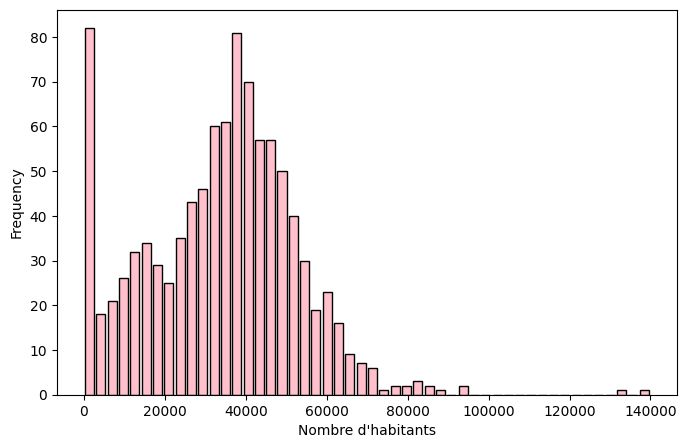

In [114]:
# Histogramme de distribution des densités de population par IRIS

ax = IRIS2154.plot.hist(y='Densite', figsize=(8, 5), bins=50, rwidth=0.8, edgecolor='black', color='pink',legend=False)
ax.set_xlabel("Nombre d'habitants")

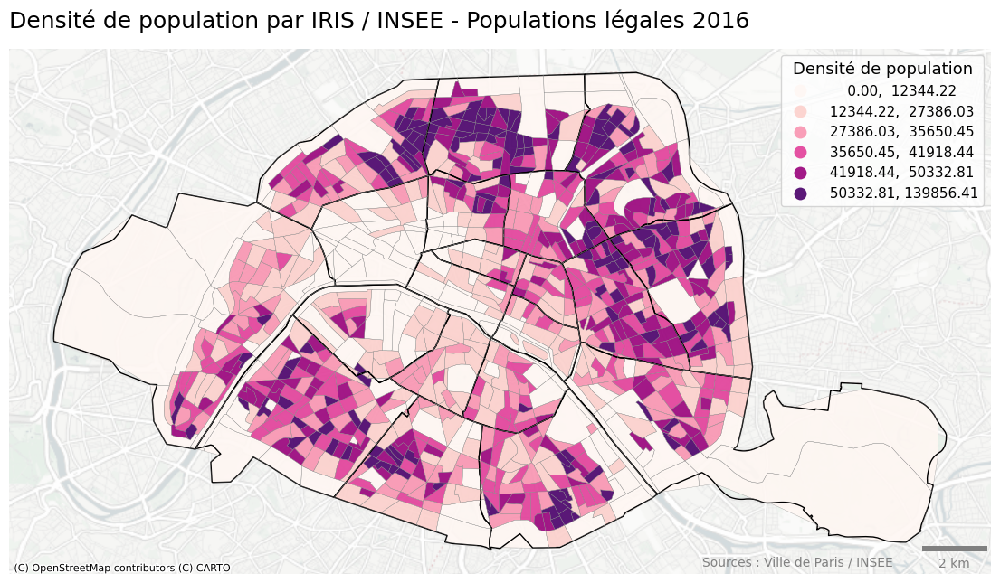

In [134]:
#Faire une carte finalisée des densités de population par IRIS

Carte2, ax = plt.subplots(figsize=(14,14))

Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=1, color = 'black')
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.2, color = 'grey')
IRIS2154.to_crs('EPSG:3857').plot(ax=ax, k=6, column='Densite', cmap='RdPu',scheme='quantiles', alpha= 0.9,
                                  legend=True, legend_kwds={'title': "Densité de population", 'loc': 'upper right', 'title_fontsize':13, 'fontsize':11})
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.PositronNoLabels)

ax.axis("off")
plt.title('Densité de population par IRIS / INSEE - Populations légales 2016', loc='left', fontsize=18)
ax.text(0.90, 0.01, 'Sources : Ville de Paris / INSEE', verticalalignment='bottom', horizontalalignment='right',
        transform=ax.transAxes, color='grey', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location = "lower right", box_alpha=0, color="grey"))

plt.show()

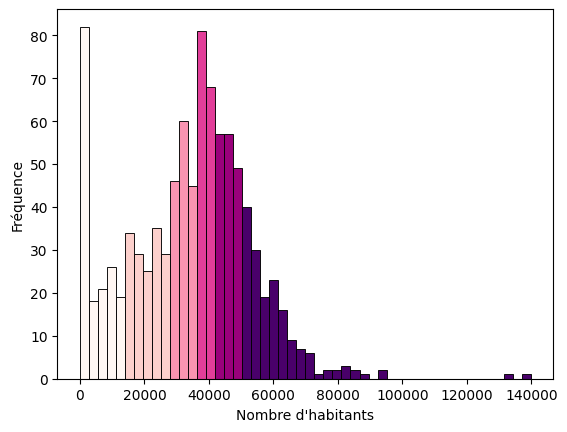

In [147]:
# Histogramme en fonction de la discrétisation de la carte

import seaborn as sns

# Nombre de quantiles
num_quantiles = 6

# Calculer les quantiles
quantiles = pd.qcut(IRIS2154['Densite'], num_quantiles, labels=False)

# Tracer l'histogramme avec des couleurs de quantiles en utilisant Seaborn
sns.histplot(data=IRIS2154, x='Densite', bins=50, hue=quantiles, palette='RdPu',  alpha=1, legend=False)

# Définir les étiquettes des axes
plt.xlabel("Nombre d'habitants")
plt.ylabel("Fréquence")

# Afficher le graphe
plt.show()

## Dissolve(With Stat)

,geometry,nom_iris,insee_com,code_iris,Code_IRIS,Libelle,Population
ardt,,,,,,,
01,"POLYGON ((2.34691 48.85669, 2.34634 48.85587, ...",Tuileries,75101,751010105,751010105,Tuileries,0.000000
02,"POLYGON ((2.34126 48.86562, 2.33998 48.86591, ...",Vivienne 1,75102,751020601,751020601,Vivienne 1,1669.175559
03,"POLYGON ((2.35268 48.86139, 2.35139 48.86167, ...",Enfants Rouges 2,75103,751031002,751031002,Enfants Rouges 2,2297.216356
04,"POLYGON ((2.34779 48.85798, 2.34832 48.85881, ...",Saint-Gervais 2,75104,751041402,751041402,Saint-Gervais 2,2173.956963
05,"POLYGON ((2.34464 48.83777, 2.34334 48.83803, ...",Val de Grace 7,75105,751051907,751051907,Val-de-Grace 7,2394.194331


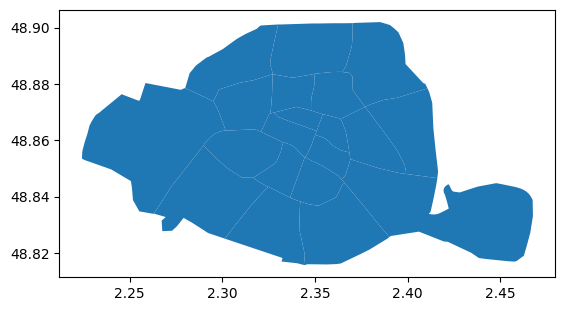

In [125]:
# Créer une couche des arrondissements en regroupant selon la variable nom_com

ARDT = IRISPARIS.dissolve(by='ardt')
ARDT.plot()
ARDT.head()

In [126]:
# Créer une couche des arrondissements avec une agrégation statistiques (Population)

ARDT = IRIS2154.dissolve(by='insee_com', aggfunc='sum')
ARDT.head()


<ipython-input-126-7a7033c06007>:3: FutureWarning: The default value of numeric_only in aggfunc='sum' within pandas.DataFrameGroupBy.agg used in dissolve is deprecated. In pandas 2.0, numeric_only will default to False. Either specify numeric_only as additional argument in dissolve() or select only columns which should be valid for the function.
  ARDT = IRIS2154.dissolve(by='insee_com', aggfunc='sum')


,geometry,code_iris,Code_IRIS,Population,surface,Densite
insee_com,,,,,,
75101,"POLYGON ((652081.290 6862048.180, 652038.370 6...",12767173644,12767173644,16545.0,1.827486,196419.344299
75102,"POLYGON ((651674.870 6863044.640, 651580.760 6...",10514289534,10514289534,20796.0,0.994136,328710.884634
75103,"POLYGON ((652508.700 6862567.660, 652413.950 6...",12767527745,12767527745,35049.0,1.171823,557159.554395
75104,"POLYGON ((653050.930 6861120.690, 652966.350 6...",15771870725,15771870725,27146.0,1.619944,359457.988367
75105,"POLYGON ((651897.060 6859945.570, 651801.780 6...",23282607514,23282607514,59333.0,2.516924,834564.296242


In [127]:
# Vérifier la population dans les IRIS (niveau de départ) et dans les arrondissements (résultat de l'aggrégation spatiale)

A= IRISPARIS["Population"].sum()
B= ARDT["Population"].sum()

print ("Population IRIS = " + str(A) + "\nPopulation Arrondissements = " + str(B) ) # \n permet de sauter une ligne lors de l'impression d'une chaîne de caractères en Python

Population IRIS = 2206488.0
Population Arrondissements = 2206488.0



## Exercice avec les données de logement des IRIS

https://opendata.apur.org/datasets/recensement-iris-logement/data


* Produire une carte avec en cercle proportionnels le nombre de logement sociaux
* Produire une carte avec en aplat de couleur le taux de logement vacant



In [128]:
#Téléchargement des datas depuis l'opendata (https://opendata.apur.org/datasets/recensement-iris-population/geoservice)
!wget -O logement.csv https://opendata.arcgis.com/datasets/a57b54a5ae1046068a203d13d744343b_2.csv?outSR=%7B%22latestWkid%22%3A2154%2C%22wkid%22%3A102110%7D

--2024-03-17 13:43:46--  https://opendata.arcgis.com/datasets/a57b54a5ae1046068a203d13d744343b_2.csv?outSR=%7B%22latestWkid%22%3A2154%2C%22wkid%22%3A102110%7D
Resolving opendata.arcgis.com (opendata.arcgis.com)... 54.197.243.216, 23.23.51.121, 44.215.202.167
Connecting to opendata.arcgis.com (opendata.arcgis.com)|54.197.243.216|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘logement.csv’

logement.csv            [  <=>               ]   3.40M  8.95MB/s    in 0.4s    

2024-03-17 13:43:47 (8.95 MB/s) - ‘logement.csv’ saved [3560464]



In [129]:
#Importer CSV to dataframe

logement = pd.read_csv("logement.csv", sep=',')
logement.head(3)

,OBJECTID,n_sq_ir,c_cainsee,n_qu,c_ir,c_typeir,l_ir,m2_ip,m2_pop,m2_emp,...,evo_pct_rp_5pp,nb_men_voit,pct_men_voit,nb_men_voit_n5,pct_men_voit_n5,evo_pct_men_voit,n_sq_epci,l_epci,shape_Length,shape_Area
0,1,930003891,93048,0.0,930480801,H,Bel Air Grands Pêchers 1,115523.688783,106227.518051,114780.364397,...,4.595114,674.180839,58.481746,716.254373,61.071292,-2.589546,140.0,T8 Est Ensemble,1927.186327,139705.062882
1,2,930003875,93048,0.0,930480803,H,Bel Air Grands Pechers 3,88014.547679,80896.936435,81518.540816,...,3.845138,437.745301,54.807347,374.788998,51.381302,3.426045,140.0,T8 Est Ensemble,1597.143066,106750.396820
2,3,930003874,93048,0.0,930480901,H,Ramenas Fabien Lagrange 1,158411.119470,138753.241185,149619.390800,...,-4.477577,514.408272,56.398130,513.187423,58.559052,-2.160922,140.0,T8 Est Ensemble,2494.946453,209582.967651


In [130]:
# Ne garder que les colonne importantes

LogementOK = logement[["c_ir", "l_ir", "nb_log", "nb_logvac", "nb_loc_social"]]
LogementOK.head()

,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social
0,930480801,Bel Air Grands Pêchers 1,1215.000069,42.734671,382.744007
1,930480803,Bel Air Grands Pechers 3,827.500048,27.783878,548.040149
2,930480901,Ramenas Fabien Lagrange 1,1007.500054,83.311007,135.500873
3,930480903,Ramenas Fabien Lagrange 3,1174.500064,104.873548,349.870857
4,930481002,Branly Boissiere 2,713.000038,50.006217,139.873760


In [131]:
# Faire la jointure attributaire

IRISPARIS = IRISPARIS.merge(LogementOK, left_on='code_iris', right_on='c_ir')
IRISPARIS.head(2)

,nom_iris,insee_com,code_iris,geometry,ardt,Code_IRIS,Libelle,Population,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social
0,Val de Grace 7,75105,751051907,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ...",05,751051907,Val-de-Grace 7,2394.194331,751051907,Val-de-Grace 7,1325.507235,98.032090,89.589028
1,Gros Caillou 7,75107,751072807,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ...",07,751072807,Gros Caillou 7,2257.124076,751072807,Gros Caillou 7,1289.498225,53.253745,3.273282


In [132]:
#Calculer le taux de logements vacant

IRISPARIS["txlogvac"] = IRISPARIS["nb_logvac"] / IRISPARIS["nb_log"] *100
IRISPARIS.head()

,nom_iris,insee_com,code_iris,geometry,ardt,Code_IRIS,Libelle,Population,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social,txlogvac
0,Val de Grace 7,75105,751051907,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ...",05,751051907,Val-de-Grace 7,2394.194331,751051907,Val-de-Grace 7,1325.507235,98.032090,89.589028,7.395817
1,Gros Caillou 7,75107,751072807,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ...",07,751072807,Gros Caillou 7,2257.124076,751072807,Gros Caillou 7,1289.498225,53.253745,3.273282,4.129804
2,Madeleine 3,75108,751083103,"POLYGON ((2.31961 48.87451, 2.31962 48.87449, ...",08,751083103,Madeleine 3,1089.533803,751083103,Madeleine 3,674.212770,86.884528,42.172518,12.886811
3,Roquette 18,75111,751114318,"POLYGON ((2.38202 48.86019, 2.38281 48.85939, ...",11,751114318,Roquette 18,2197.653733,751114318,Roquette 18,1654.497143,118.252164,10.132180,7.147318
4,Folie Mericourt 14,75111,751114114,"POLYGON ((2.37303 48.87062, 2.37301 48.87041, ...",11,751114114,Folie Mericourt 14,1706.345042,751114114,Folie Mericourt 14,1232.497955,172.140363,0.000000,13.966787


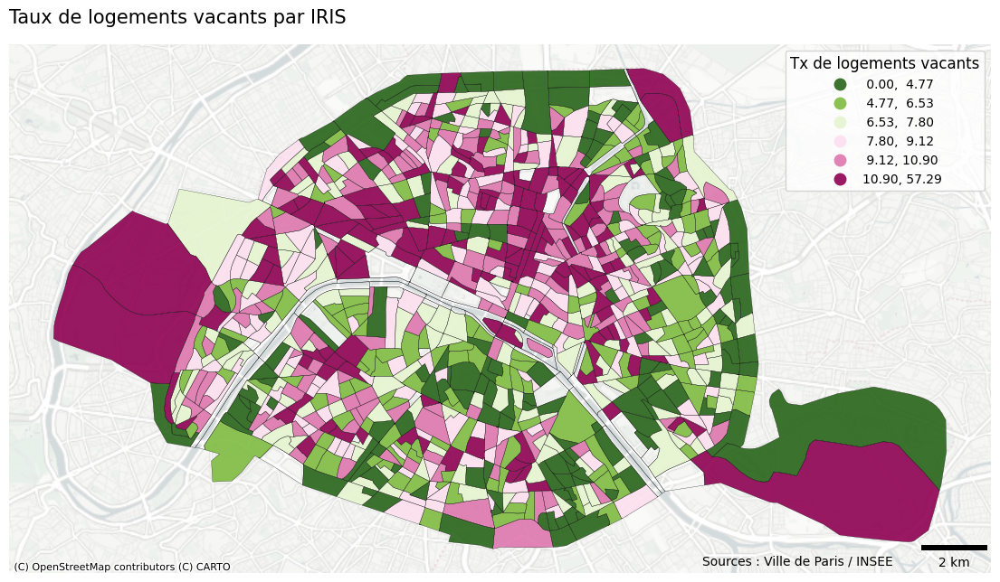

In [140]:
#Faire une carte du taux de logements vacants par IRIS

Carte4, ax = plt.subplots(figsize=(14,14))

IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.2, color = 'black')
IRISPARIS.to_crs('EPSG:3857').plot(ax=ax, k=6, column='txlogvac', cmap='PiYG_r',scheme='quantiles', alpha=0.9,
                                    legend=True, legend_kwds={'title': "Tx de logements vacants", 'loc': 'upper right', 'title_fontsize':12, 'fontsize':10})
ctx.add_basemap(ax, source=ctx.providers.CartoDB.PositronNoLabels)

ax.axis("off")
plt.title('Taux de logements vacants par IRIS', loc='left', fontsize=15)
ax.text(0.90, 0.01, 'Sources : Ville de Paris / INSEE', verticalalignment='bottom', horizontalalignment='right',
        transform=ax.transAxes, color='black', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location = "lower right", box_alpha=0, color="black"))

plt.show()

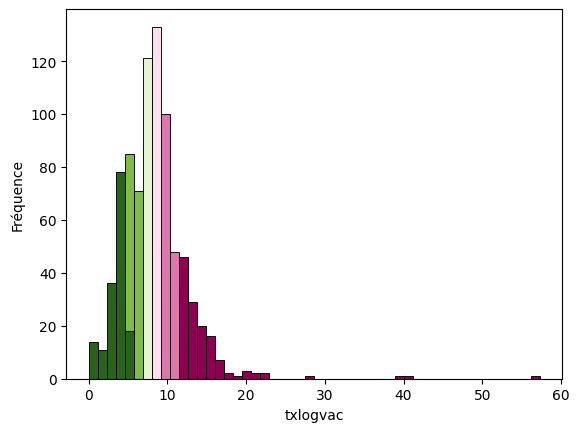

In [145]:
# Histogramme en fonction de la discrétisation de la carte

import seaborn as sns

# Nombre de quantiles
num_quantiles = 6

# Calculer les quantiles
quantiles = pd.qcut(IRISPARIS['txlogvac'], num_quantiles, labels=False)

# Tracer l'histogramme avec des couleurs de quantiles en utilisant Seaborn
sns.histplot(data=IRISPARIS, x='txlogvac', bins=50, hue=quantiles, palette='PiYG_r',  alpha=1, legend=False)

# Définir les étiquettes des axes
plt.xlabel("txlogvac")
plt.ylabel("Fréquence")

# Afficher le graphe
plt.show()

In [148]:
# Calculer le taux de logements sociaux par IRIS

IRISPARIS['Txlogsocial'] = IRISPARIS["nb_loc_social"] / IRISPARIS["nb_log"] *100
IRISPARIS.head(2)

,nom_iris,insee_com,code_iris,geometry,ardt,Code_IRIS,Libelle,Population,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social,txlogvac,Txlogsocial
0,Val de Grace 7,75105,751051907,"POLYGON ((2.34364 48.84122, 2.34424 48.84245, ...",05,751051907,Val-de-Grace 7,2394.194331,751051907,Val-de-Grace 7,1325.507235,98.032090,89.589028,7.395817,6.758849
1,Gros Caillou 7,75107,751072807,"POLYGON ((2.30090 48.85113, 2.29990 48.85173, ...",07,751072807,Gros Caillou 7,2257.124076,751072807,Gros Caillou 7,1289.498225,53.253745,3.273282,4.129804,0.253842


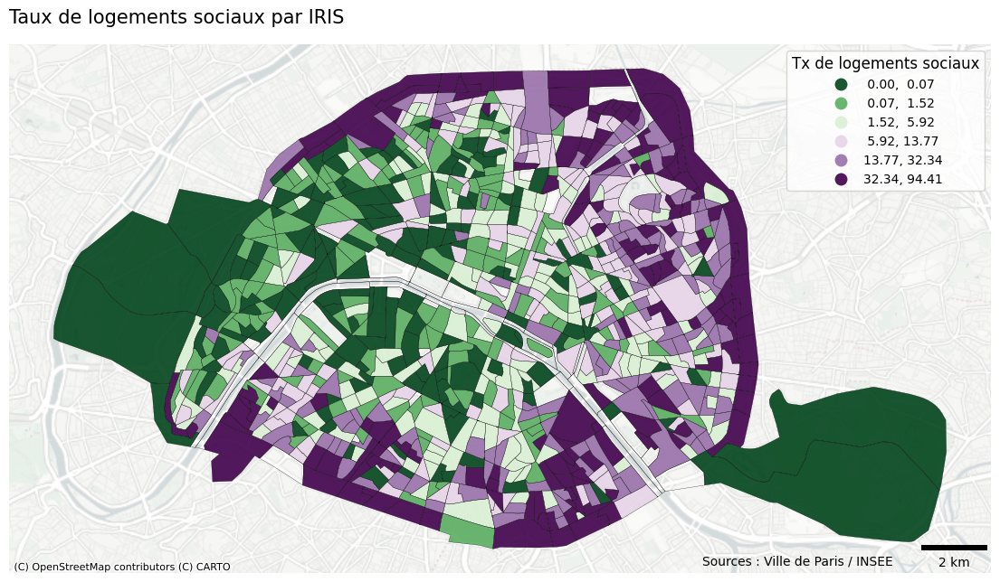

In [157]:
#Faire une carte du taux de logements sociaux par IRIS

Carte4, ax = plt.subplots(figsize=(14,14))

IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.2, color = 'black')
IRISPARIS.to_crs('EPSG:3857').plot(ax=ax, k=6, column='Txlogsocial', cmap='PRGn_r',scheme='quantiles', alpha=0.9,
                                  legend=True, legend_kwds={'title': "Tx de logements sociaux", 'loc': 'upper right', 'title_fontsize':12, 'fontsize':10})
ctx.add_basemap(ax, source=ctx.providers.CartoDB.PositronNoLabels)

ax.axis("off")
plt.title('Taux de logements sociaux par IRIS', loc='left', fontsize=15)
ax.text(0.90, 0.01, 'Sources : Ville de Paris / INSEE', verticalalignment='bottom', horizontalalignment='right',
        transform=ax.transAxes, color='black', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location = "lower right", box_alpha=0, color="black"))

plt.show()

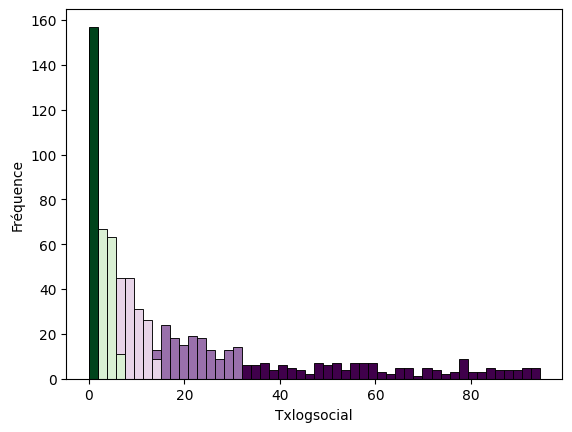

In [156]:
# Histogramme en fonction de la discrétisation de la carte

import seaborn as sns

# Nombre de quantiles
num_quantiles = 6

# Calculer les quantiles
quantiles = pd.qcut(IRISPARIS['Txlogsocial'], num_quantiles, labels=False)

# Tracer l'histogramme avec des couleurs de quantiles en utilisant Seaborn
sns.histplot(data=IRISPARIS, x='Txlogsocial', bins=50, hue=quantiles, palette='PRGn_r',  alpha=1, legend=False)

# Définir les étiquettes des axes
plt.xlabel("Txlogsocial")
plt.ylabel("Fréquence")

# Afficher le graphe
plt.show()

<ipython-input-65-2ed0e4f10408>:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  IRIScentro.geometry = IRIScentro['geometry'].centroid


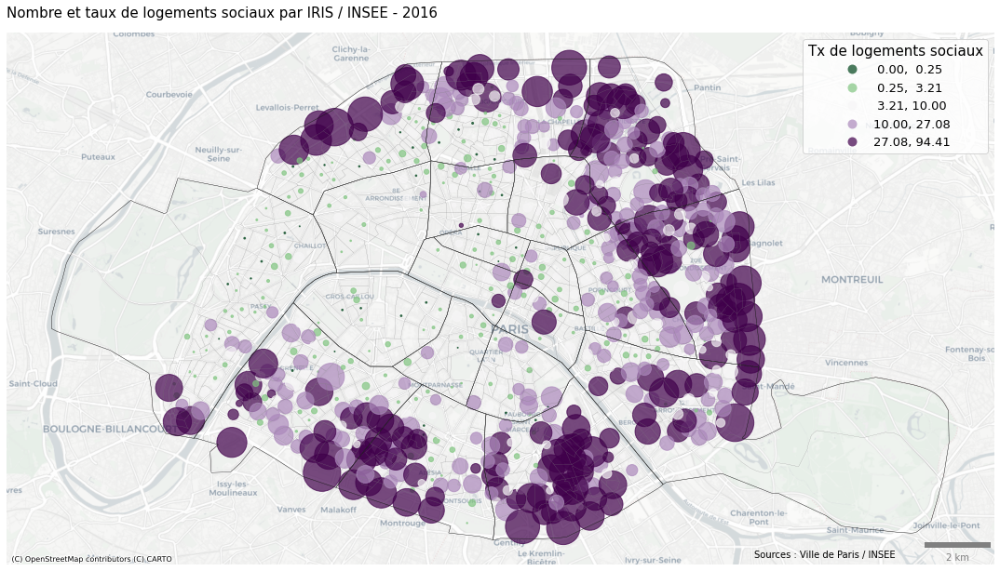

In [ ]:
# Faire une carte du nombre de logements sociaux par IRIS


## Commencer par créer un geodataframe sous forme de points
IRIScentro = IRISPARIS.copy()
IRIScentro.geometry = IRIScentro['geometry'].centroid


## Faire la carte

Carte5, ax = plt.subplots(figsize=(19,19))
ARDT.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.4, color = 'black')
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'grey')
IRIScentro.to_crs('EPSG:3857').plot(ax=ax, markersize="nb_loc_social", alpha=0.7, column="Txlogsocial", cmap='PRGn_r',scheme='quantiles', categorical=False,
                                    legend=True, legend_kwds={'title': "Tx de logements sociaux", 'loc': 'upper right', 'title_fontsize':15, 'fontsize':13})
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

ax.axis("off")
plt.title('Nombre et taux de logements sociaux par IRIS / INSEE - 2016', loc='left', fontsize=15)
ax.text(0.90, 0.01, 'Sources : Ville de Paris / INSEE', verticalalignment='bottom', horizontalalignment='right',
        transform=ax.transAxes, color='black', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location = "lower right", box_alpha=0, color="grey"))

plt.show()

# Exercices en autonomie

## Faire une planche avec deux cartes

Exemples : https://coderzcolumn.com/tutorials/data-science/plotting-static-maps-with-geopandas-working-with-geospatial-data#4


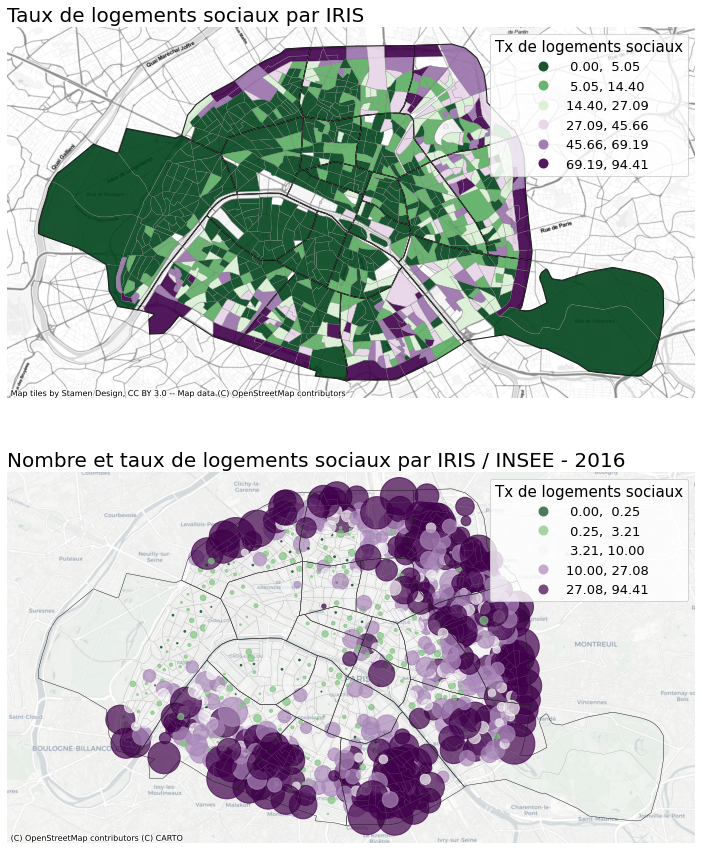



## Faire la carte du tx de locataire par IRIS

pct_prop = pourcentage de propriétaire


